# Проект "Рынок заведений общественного питания Москвы"

# Введение

Инвесторы из фонда «Shut Up and Take My Money» хотят открыть новое заведение в Москве. Для этого им требуется анализ рынка общественного питания Москвы. Целью данного исследования являтся поиск закономерностей популярности тех или иных заведений общественного питания: кафе, ресторан, бар, пиццерия и т.д. Попробуем разобраться в данных о заведениях общественного питания Москвы на лето 2022 года.

<a id="ogl"></a>
## Оглавление

* [Оглавление](#ogl)
* [Загрузка данных и изучение общей информации](#setup)
* [Предобработка данных](#obrabotka)
    * [Создаем столбец с названием улицы](#obrabotka1)
    * [Создаем столбец с обозначением круглосуточных заведений](#obrabotka2)
* [Анализ данных](#results)
    * [Изучение количества объектов общественного питания по категориям](#results1)
    * [Изучение количества посадочных мест в заведениях по категориям](#results2)
    * [Анализ сетевых и несетевых заведений](#results3)
    * [Анализ сетевых заведений по категориям](#results4)
    * [Анализ топ-15 сетевых заведений в Москве](#results5)
    * [Изучение распределения заведений по районам Москвы](#results6)
    * [Распределение средних рейтингов по категориям заведений](#results7)
    * [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#results8)
    * [Заведения общественного питания г.Москвы на карте](#results9)
    * [Топ-15 улиц по количеству заведений](#results10)
    * [Улицы с одним объектом общепита](#results11)
    * [Фоновая картограмма (хороплет) с медианой средней цены чека для каждого района](#results12)
* [Детализируем исследование: открытие кофейни](#coffee)
    * [Анализ кофеен в датасете](#coffee1)
    * [Круглосуточные кофейни](#coffee2)
    * [Рейтинг кофеен](#coffee3)
    * [Анализ стоимости чашки капуччино](#coffee4)
* [Заключение](#vivod)

<a id="setup"></a>
## Загрузка данных и изучение общей информации

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import plotly.graph_objs as go
import plotly.express as px
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings
warnings.simplefilter('ignore')

In [2]:
# выгрузка датасета
places = pd.read_csv('D:/Datasets/8. Как рассказать историю/moscow_places.csv')
display(places.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В нашем распоряжении информация о 8406 заведениях г. Москва

<a id="obrabotka"></a>
## Предобработка данных

In [4]:
print('Количество пропусков:', places.isna().sum().sort_values(ascending=False), 
      'Количество дубликатов:', places.duplicated().sum(), sep='\n')

Количество пропусков:
middle_coffee_cup    7871
middle_avg_bill      5257
price                5091
avg_bill             4590
seats                3611
hours                 536
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64
Количество дубликатов:
0


Пропуски имеются в столбцах: 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats'. Все эти данные сложно каким-то образом заполнить, так как это может исказить результаты анализа. Пропуски не заполняем.

Дубликаты в датасете отсутствуют.

In [5]:
# процент пропусков
places.isna().mean().sort_values(ascending=False)*100

middle_coffee_cup    93.635498
middle_avg_bill      62.538663
price                60.563883
avg_bill             54.603854
seats                42.957411
hours                 6.376398
name                  0.000000
category              0.000000
address               0.000000
district              0.000000
lat                   0.000000
lng                   0.000000
rating                0.000000
chain                 0.000000
dtype: float64

Так как процент данных с пропусками довольно высок, удалять мы их не будем.

Вывод: в датасете мы имеем информацию о 8406 заведений.
дубликаты отсутствуют


In [6]:
repeated_values = places.loc[places.duplicated(subset=['lat', 'lng'], keep=False)]
repeated_values.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
121,Встреча,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN
271,Алали,быстрое питание,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.875804,37.665551,4.2,NaN,NaN,NaN,NaN,0,100.0
273,Pho Oanh,кафе,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,NaN,NaN,1,100.0
348,Meat Лав,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,Средний счёт:300–600 ₽,450.0,NaN,0,NaN


In [7]:
repeated_values['name'].unique()

array(['Встреча', 'Карелия', 'Алали', 'Pho Oanh', 'Meat Лав',
       'Family Cafe Mayak', 'Кафе', 'Халяль Кафе-Пекарня',
       'Кафе-кулинария Сикварули', 'More poke', 'Сикварули', 'More Poke',
       'Бансонс Бургер Китчен', 'Лепим и Варим', 'Чайхана Doner кафе',
       'Dragon bubble tea', 'Чайхана Döner', 'Dragon Mixology Bar',
       'Прошу к столу', 'Georgian Garden', 'Позы&Буузы', 'Хинкальная',
       'Ava', 'Чайхона №1', 'Patriki', 'Steak it easy',
       'Пельменная-вареничная', 'Пловная-чебуречная', 'Стейк & Бургер',
       'Soul in the Bowl', 'Leon', 'Леон', 'Белая Птица',
       'Франклинс Бургер', 'Креветочная', 'Союз Кофе',
       'Кулинарная лавка братьев Караваевых', 'ДаблБи', 'Эдельвейс',
       'Laserland кафе', 'Восточная кухня', 'Городское',
       'Любовь Пирогова', 'Prime', 'Fibo Pasta & Ravioli', 'Bổ',
       'Узбечка', 'Campus', 'Папа Джонс', 'Кравченко 8 СТР. 6',
       'Loft-cafe академия', 'Кафе Восток', 'Кофе', 'Южная Ночь',
       'Старый дворик', 'Кофеше

Действительно есть похожие названия:

'More poke' и 'More Poke'

'Чайхана Doner кафе' и 'Чайхана Döner'

'Leon' и 'Леон'

In [8]:
repeated_values1 = repeated_values.loc[(repeated_values['name'] == 'More poke') | (repeated_values['name'] == 'More Poke')]
repeated_values1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [9]:
repeated_values2 = repeated_values.loc[(repeated_values['name'] == 'Чайхана Doner кафе') | (repeated_values['name'] == 'Чайхана Döner')]
repeated_values2

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2697,Чайхана Doner кафе,кафе,"Москва, Измайловский проспект, 61, стр. 2",Восточный административный округ,"ежедневно, круглосуточно",55.78861,37.78397,4.0,NaN,NaN,NaN,NaN,0,15.0
2841,Чайхана Döner,кафе,"Москва, Измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.78861,37.78397,4.0,NaN,NaN,NaN,NaN,0,NaN


In [10]:
repeated_values3 = repeated_values.loc[(repeated_values['name'] == 'Leon') | (repeated_values['name'] == 'Леон')]
repeated_values3

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5314,Leon,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.3,NaN,NaN,NaN,NaN,1,NaN
5316,Леон,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.4,NaN,NaN,NaN,NaN,0,NaN


У всех пар заведений одинаковые координаты и адреса, значит эти строки дублируются.

In [11]:
# удаляем дублирующиеся строки
places = places.query("index != 1511 & index != 2841 & index != 5316")

In [12]:
places.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4794 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


Дублирующиеся строки удалены. Было 8406 строк, стало 8403.

<a id="obrabotka1"></a>
### Создаем стобец с названием улицы

In [13]:
places['street'] = places['address'].str.split(", ", expand=True)[1]
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


<a id="obrabotka2"></a>
### Создаем стобец с обозначением круглосуточных заведений

In [14]:
def categorize_24_7(row):
    # Проверяем, если row не является NaN и является строкой
    if isinstance(row, str) and 'круглосуточно' in row and 'ежедневно' in row:
        return True
    else: 
        return False

In [15]:
# добавляем столбец is_24/7 и применяем к нему функцию categorize_24_7
places['is_24/7'] = places['hours'].apply(categorize_24_7)
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [16]:
places.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8403.000000,8403.000000,8403.000000,3149.000000,535.000000,8403.000000,4794.000000
mean,55.750096,37.608541,4.229906,958.053668,174.721495,0.381292,108.405090
std,0.069666,0.098568,0.470422,1009.732845,88.951103,0.485733,122.840831
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705018,37.538598,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753395,37.605233,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795038,37.664771,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


<a id="results"></a>
## Анализ данных

<a id="results1"></a>
### Изучение количества объектов общественного питания по категориям

In [17]:
# сводная таблица заведений по категориям
category = places.pivot_table(index='category',values='name',aggfunc='count').sort_values(by='name', ascending=False).reset_index()
display(category)

print('Общее количество заведений:', category.name.sum())

,category,name
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Общее количество заведений: 8403


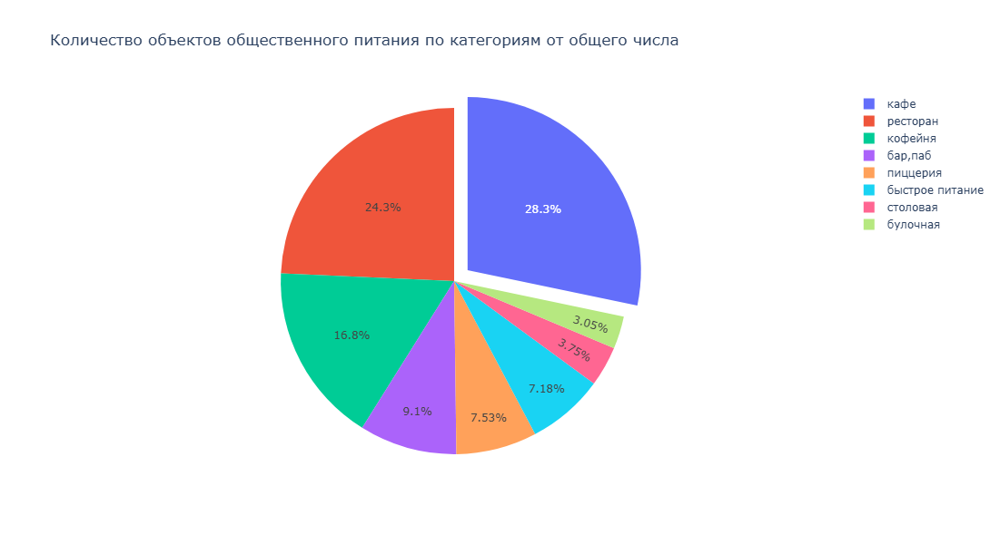

In [18]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=category['category'], 
    values=category['name'],
    pull = [0.1])]) 
fig.update_layout(
    title="Количество объектов общественного питания по категориям от общего числа",
    height = 600,
    width = 800)
fig.show()

Вывод: самым популярным типом заведения в Москве является кафе - 28.3 % от общего количества заведений.

<a id="results2"></a>
### Изучение количества посадочных мест в заведениях по категориям

In [19]:
#сводная таблица посадочных мест заведений по категориям
seats = places.pivot_table(index='category',values='seats',aggfunc='median')\
            .sort_values(by='seats', ascending=False).reset_index()
seats.columns = ['category', 'seats_median']
display(seats)

,category,seats_median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


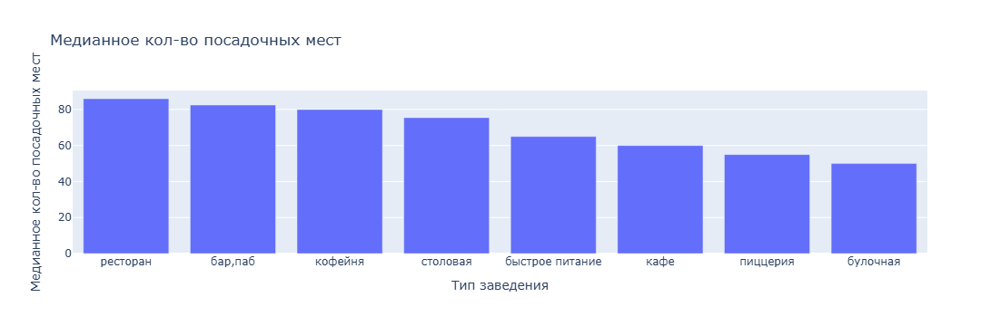

In [20]:
# столбчатая диаграмма
fig = px.bar(seats, x='category', y='seats_median',
            labels={'category':'Тип заведения', 'seats_median':'Медианное кол-во посадочных мест'},
            title='Медианное кол-во посадочных мест')
fig.show()

Вывод: в топе-3 по посадочным местам находятся ресторан, бар/паб и кофейня.

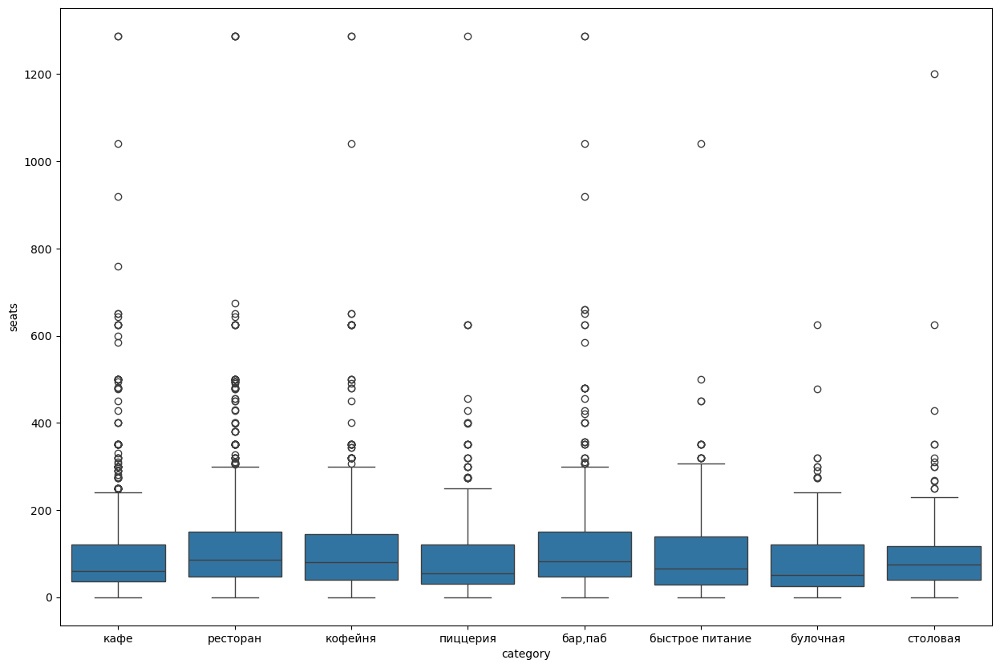

In [21]:
#диаграмма размаха
plt.figure(figsize=(15, 10))

fig = sns.boxplot(x='category', y='seats', data=places)
plt.show()

На графике видны выбросы до 1200 посадочных месте. Такого конечно в реальности быть не может.

In [22]:
# заполним пустыми значениями там, где посадочных мест больше 400
places.loc[places['seats'] > 400, 'seats'] = 'NaN'

In [23]:
# вернем тип данных float столбцу 'seats'
places['seats'] = places['seats'].astype(float)

In [24]:
places.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8403 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4673 non-null   float64
 14  street             8403 non-null   object 
 15  is_24/7            8403 non-null   bool   
dtypes: bool(1), float64(6), int64

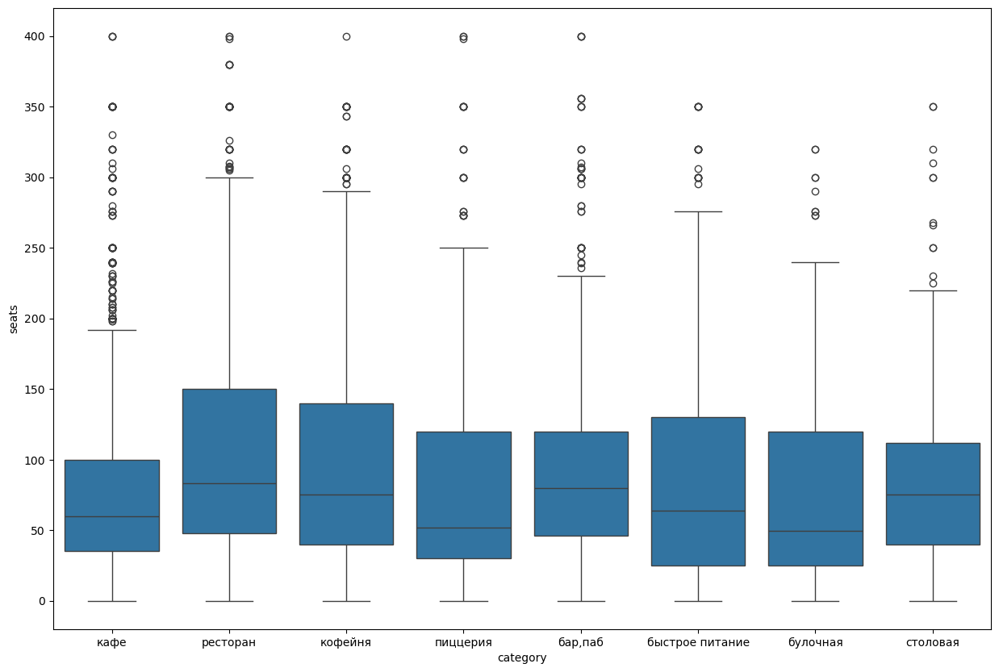

In [25]:
#диаграмма размаха
plt.figure(figsize=(15, 10))

fig = sns.boxplot(x='category', y='seats', data=places)
plt.show()

In [26]:
#сводная таблица посадочных мест заведений по категориям
seats1 = places.pivot_table(index='category',values='seats',aggfunc='median')\
            .sort_values(by='seats', ascending=False).reset_index()
seats1.columns = ['category', 'seats_median']
display(seats)

,category,seats_median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


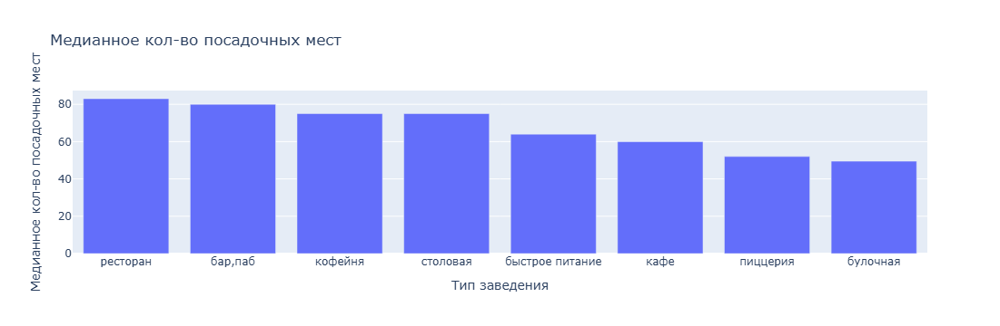

In [27]:
# столбчатая диаграмма
fig = px.bar(seats1, x='category', y='seats_median',
            labels={'category':'Тип заведения', 'seats_median':'Медианное кол-во посадочных мест'},
            title='Медианное кол-во посадочных мест')
fig.show()

<a id="results3"></a>
### Анализ сетевых и несетевых заведений

In [28]:
# сводная таблица сетевых и несетевых заведений
chain = places.pivot_table(index='chain', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
chain['chain'] = chain['chain'].astype(str)
chain['chain'] = chain['chain'].replace({'0': 'Несетевые', '1': 'Сетевые'})
display(chain)

,chain,name
0,Несетевые,5199
1,Сетевые,3204


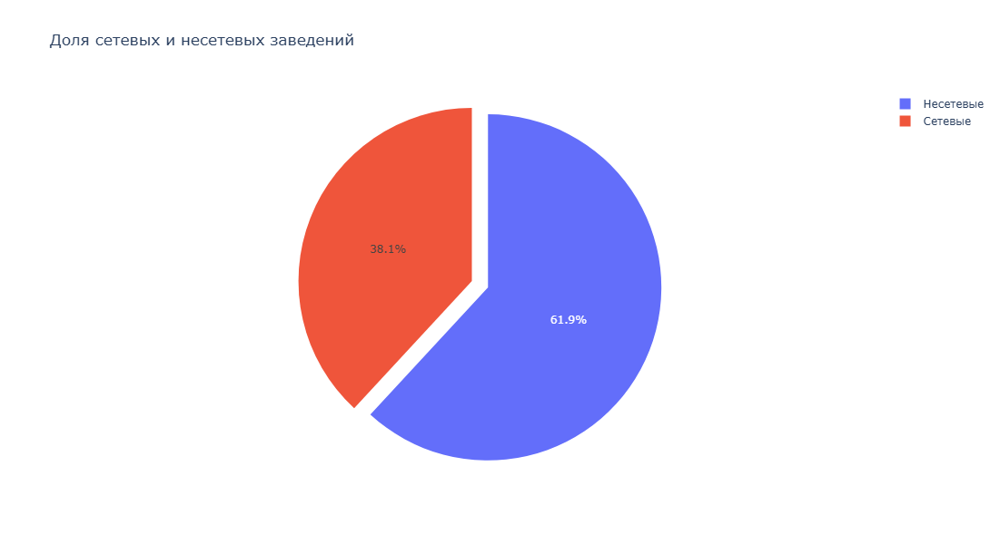

In [29]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=chain['chain'], 
    values=chain['name'],
    pull = [0.1])]) 
fig.update_layout(title="Доля сетевых и несетевых заведений",
    height = 600,
    width = 800)
fig.show()

Вывод: доля сетевых заведений составляет 38%.

<a id="results4"></a>
### Анализ сетевых заведений по категориям

In [30]:
# сводная таблица сетевых заведений по категориям
chain_sum = places.pivot_table(index=['category', 'chain'], values='name',aggfunc='count')\
                    .sort_values(by='name', ascending=False).reset_index()
display(chain_sum)

,category,chain,name
0,кафе,0,1598
1,ресторан,0,1312
2,кафе,1,779
3,ресторан,1,729
4,кофейня,1,720
5,кофейня,0,693
6,"бар,паб",0,596
7,быстрое питание,0,371
8,пиццерия,1,330
9,пиццерия,0,303


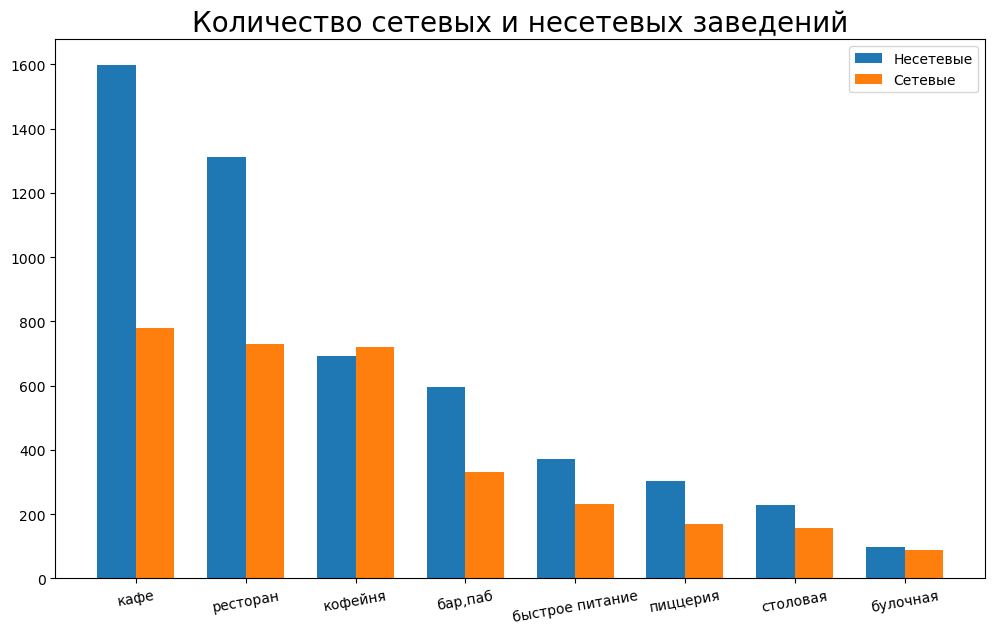

In [31]:
# отделим сетевые и несетевые заведения
chain_1 = chain_sum[chain_sum['chain'] == 1]['name']
chain_0 = chain_sum[chain_sum['chain'] == 0]['name']

index = np.arange(len(chain_0))
bw = 0.35

# столбчатая диаграмма
plt.figure(figsize=(12,7))
plt.title('Количество сетевых и несетевых заведений', fontsize=20)
plt.bar(index, chain_0, bw, label='Несетевые')
plt.bar(index+bw, chain_1, bw, label='Сетевые')

#добавляем названия заведений
plt.xticks([i + 0.35 / 2 for i in index], chain_sum['category'].unique(), rotation=10)
plt.legend()
plt.show()

Вывод: почти в каждой категории доля сетевых заведений примерно одинаковая. Только число сетевых кофеен приблизительно равно числу несетевых кофеен.

<a id="results5"></a>
### Анализ топ-15 сетевых заведений в Москве

In [32]:
# сводная таблица сетевых заведений по категориям
popular_chain = (places.query('chain == 1')
    .pivot_table(index=['category', 'name'], values='chain', aggfunc='count')
    .sort_values(by='chain', ascending=False)
    .reset_index()
    .head(15))
popular_chain.columns = ['category', 'name', 'total_count']
popular_chain

,category,name,total_count
0,кофейня,Шоколадница,119
1,пиццерия,Домино'с Пицца,76
2,пиццерия,Додо Пицца,74
3,кофейня,One Price Coffee,71
4,ресторан,Яндекс Лавка,69
5,кофейня,Cofix,65
6,ресторан,Prime,49
7,кофейня,КОФЕПОРТ,42
8,кафе,Кулинарная лавка братьев Караваевых,39
9,ресторан,Теремок,36


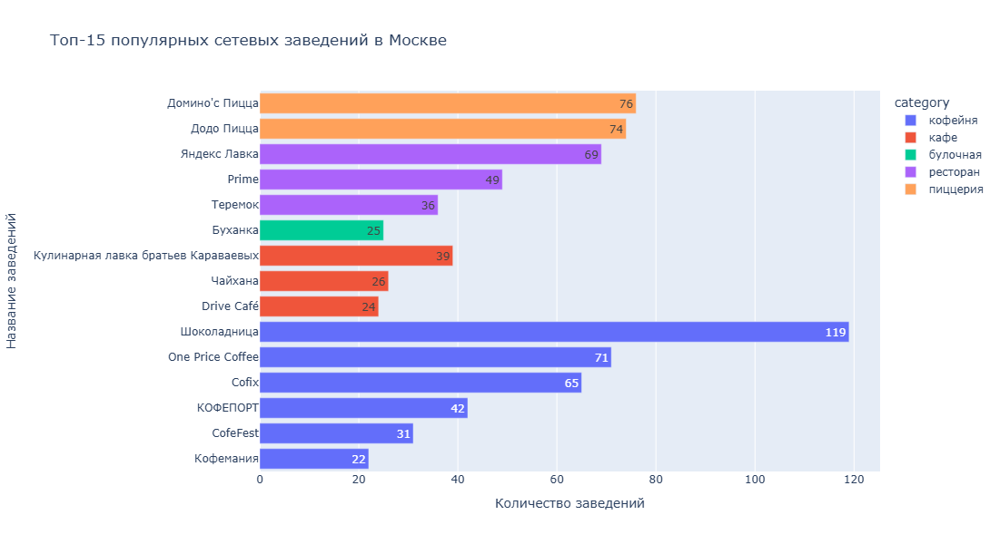

In [33]:
#строим график на основании группировки
fig = px.bar(popular_chain.sort_values(by='total_count', ascending=True),
             y='name',
             x='total_count',
             text= 'total_count',
             title="Топ-15 популярных сетевых заведений в Москве",
             color='category',
             height=600,
             width=900)
fig.update_layout(xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений')

fig.show()

Вывод: самой популярной сетью является Шоколадница - кофейня. В целом кофейни более популярны среди категорий сетевых заведений.

In [34]:
# сводная таблица сетевых заведений по категориям
popular_chain1 = (places.query('chain == 1')
    .pivot_table(index=['category', 'name', 'rating'], values='chain', aggfunc='count')
    .sort_values(by='chain', ascending=False)
    .reset_index()
    .head(15))
popular_chain1.columns = ['category', 'name', 'rating', 'total_count']
popular_chain1

,category,name,rating,total_count
0,пиццерия,Додо Пицца,4.3,48
1,кофейня,Шоколадница,4.2,46
2,пиццерия,Домино'с Пицца,4.2,40
3,кофейня,Шоколадница,4.1,36
4,пиццерия,Домино'с Пицца,4.1,27
5,кофейня,Шоколадница,4.3,26
6,кафе,Кулинарная лавка братьев Караваевых,4.4,22
7,ресторан,Prime,4.2,19
8,кофейня,One Price Coffee,4.2,18
9,кофейня,Cofix,4.2,16


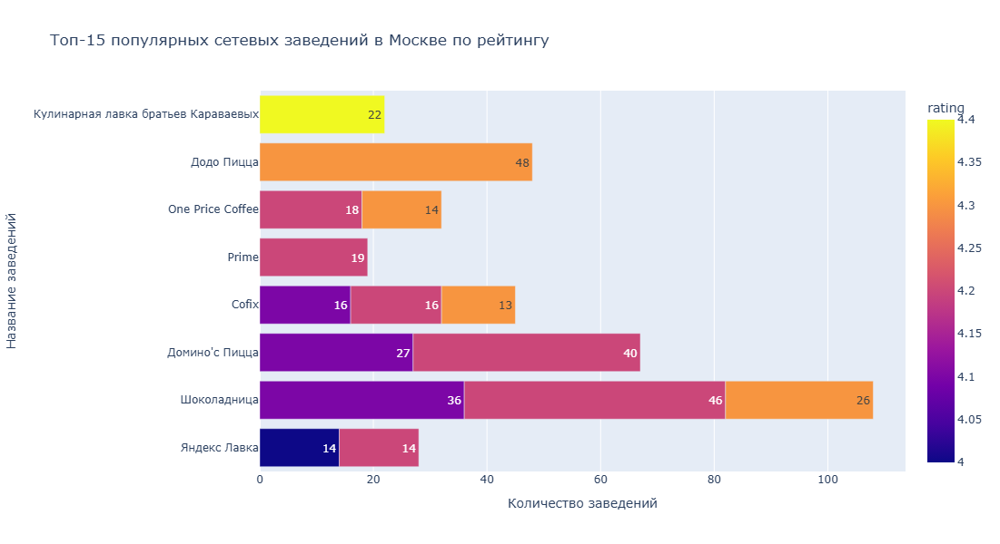

In [35]:
#строим график на основании группировки
fig = px.bar(popular_chain1.sort_values(by='rating', ascending=True),
             y='name',
             x='total_count',
             text= 'total_count',
             title="Топ-15 популярных сетевых заведений в Москве по рейтингу",
             color='rating',
             height=600,
             width=900)
fig.update_layout(xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений')

fig.show()

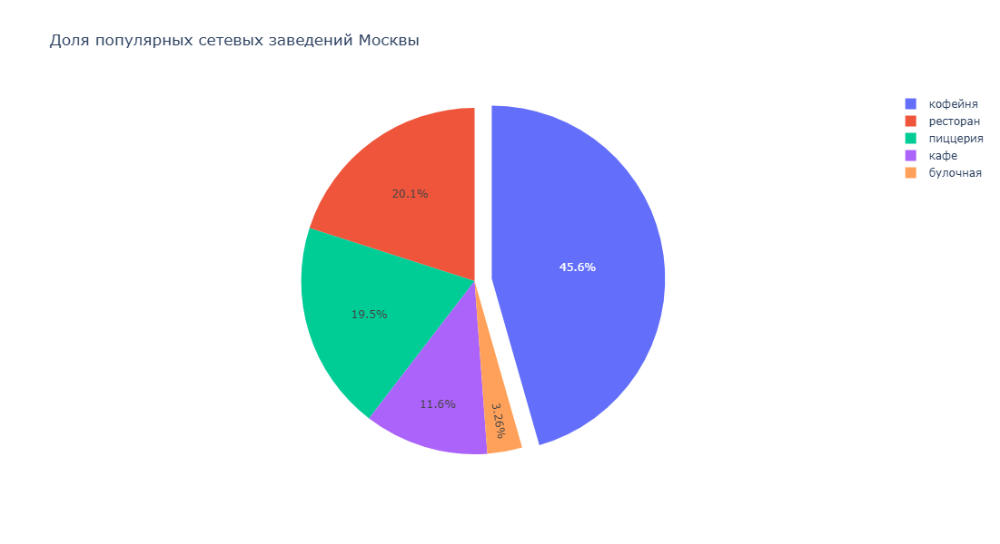

In [36]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=popular_chain['category'], 
    values=popular_chain['total_count'],
    pull = [0.1])]) 
fig.update_layout(title="Доля популярных сетевых заведений Москвы",
    height = 600,
    width = 800)
fig.show()

Вывод: самой популярной категорией сетевых заведений в Москве является кофейня.

<a id="results6"></a>
### Изучение распределения заведений по районам Москвы

In [37]:
# сводная таблица заведений по районам Москвы
districts = places.pivot_table(
    index=['district'], 
    values='name',aggfunc='count').sort_values(by='name', ascending=False).reset_index()
districts.columns = ['district', 'total_count']
display(districts)

,district,total_count
0,Центральный административный округ,2242
1,Северный административный округ,899
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,796
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


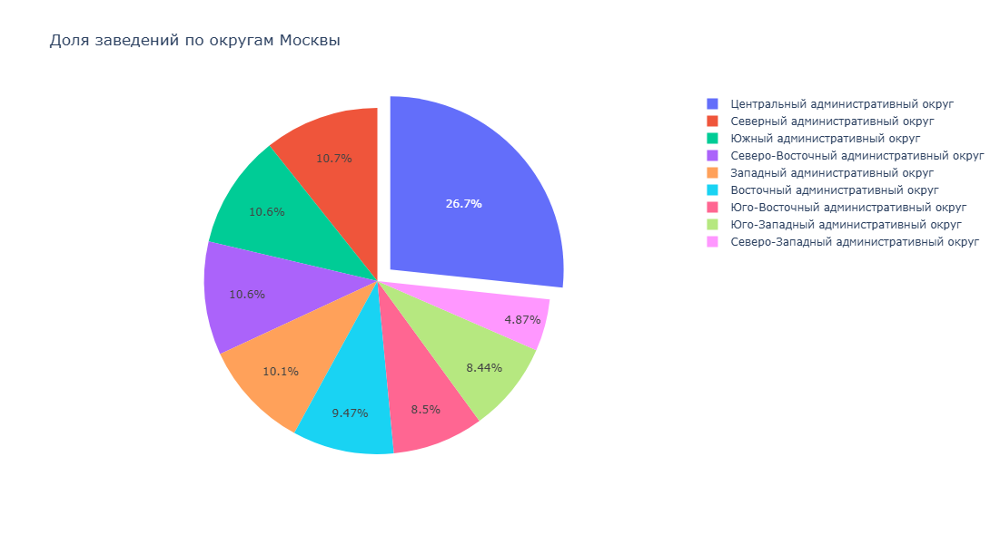

In [38]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=districts['district'], 
    values=districts['total_count'],
    pull = [0.1])]) 
fig.update_layout(title="Доля заведений по округам Москвы",
    height = 600,
    width = 800)
fig.show()

Вывод: больше всего заведений находится в ЦАО.

In [39]:
district_by_category = (places
    .pivot_table(index=['district','category'], values='name', aggfunc='count')
    
    .reset_index()
                   )
#добавлю столбец с процентом 
#вычислю общее количество заведений в каждом округе
district_by_category['sum_places'] = district_by_category.groupby('district')['name'].transform('sum')
#процент заведений
district_by_category['percent'] = round(district_by_category['name']/district_by_category['sum_places']*100, 2)
district_by_category

,district,category,name,sum_places,percent
0,Восточный административный округ,"бар,паб",53,796,6.66
1,Восточный административный округ,булочная,25,796,3.14
2,Восточный административный округ,быстрое питание,71,796,8.92
3,Восточный административный округ,кафе,271,796,34.05
4,Восточный административный округ,кофейня,105,796,13.19
...,...,...,...,...,...
67,Южный административный округ,кафе,264,892,29.60
68,Южный административный округ,кофейня,131,892,14.69
69,Южный административный округ,пиццерия,73,892,8.18
70,Южный административный округ,ресторан,202,892,22.65


Вывод: больше всего заведений находится в ЦАО. В топе- заведений ЦАО: ресторан, кафе и кофейня.
В остальных районах количество заведений примерно одинаковое. Меньше всего заведений в СЗАО.

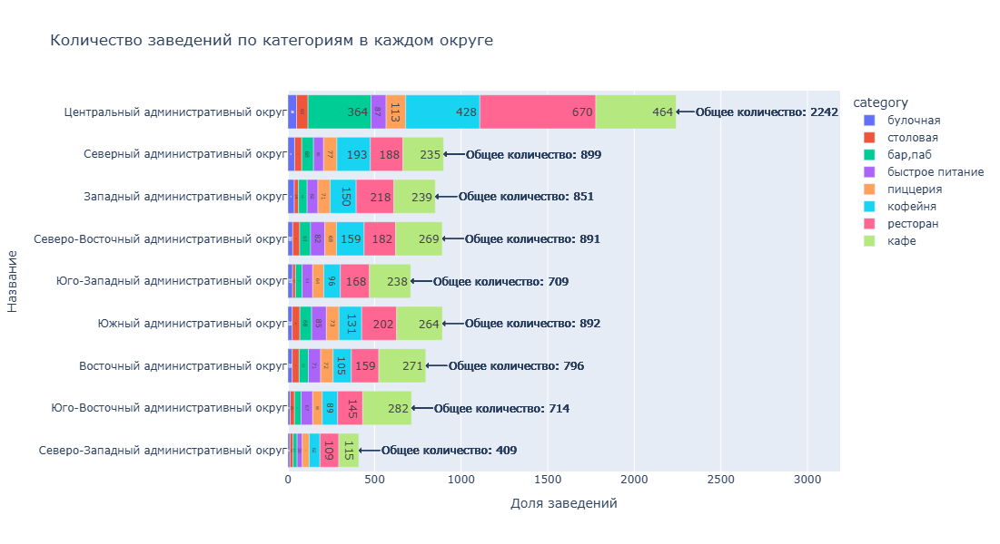

In [40]:
# столбчатая диаграмма с разбивкой по количеству заведений каждой категории
fig = px.bar(district_by_category.sort_values(by='name', ascending=True),
             y='district',
             x='name',
             text= 'name',
             color='category',
             title="Количество заведений по категориям в каждом округе",
             height=600,
             width=1000
             )

fig.update_layout(xaxis_title = 'Доля заведений',
                  yaxis_title = 'Название')

# Цикл для добавления аннотаций
for i in range(len(district_by_category)):
    fig.add_annotation(
        x=district_by_category.iloc[i, 3],  
        y=district_by_category.iloc[i, 0],  
        text=f'Общее количество: {district_by_category.iloc[i, 3]}',
        showarrow=True,
        arrowhead=1,
        ax=100,
        ay=0
    )

fig.show()

<a id="results7"></a>
### Распределение средних рейтингов по категориям заведений

In [41]:
# сводная таблица всех категорий заведений со средним рейтингом
rating = places.pivot_table(index=['category'], values='rating', aggfunc='mean').round(2)\
            .sort_values(by='rating', ascending=False).reset_index()
rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


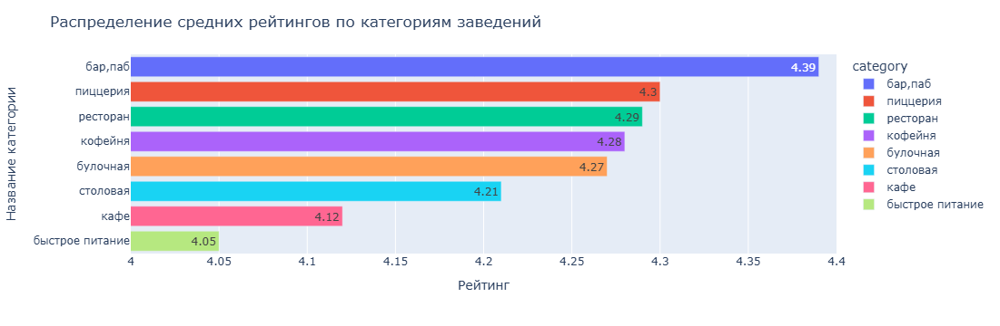

In [42]:
# стоблчатая диаграмма категорий заведений со средним рейтингом
fig = px.bar(rating,
             x='rating',
             y='category',
             text='rating',
             color='category'
            )

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Название категории')

#увеличим масштаб чтобы разница была нагляднее
fig.update_xaxes(range=[4, 4.4])
fig.show()

Вывод:

Самый высокий рейстинг у категории бар/паб. Пиццерии, рестораны, кофейни и булочные имеют средний рейтинг ≈4,29. Быстрое питание в аутсайдерах. По всем категориям рейтинг не ниже 4.

<a id="results8"></a>
### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [43]:
# сводная таблица районом Москвы со средним рейтингом
rating_by_district = places.pivot_table(index=['district'], values='rating', aggfunc='mean').round(2)\
            .sort_values(by='rating', ascending=False).reset_index()
rating_by_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [44]:
import branca.colormap as cm
# Creating the custom ramp
hex_codes = ['#0b0405', '#28192e', '#3b2e5d', '#40498e', '#366a9f', '#348ba6', '#38aaac', '#55caad', '#a1dfb9', '#def5e5']
custom_colour_map = cm.StepColormap(colors = hex_codes, vmin = 0, vmax = 10, tick_labels=[0, 4, 6, 8, 10], caption="Custom Colour Map")

In [45]:
# загружаем JSON-файл с границами округов Москвы

state_geo = 'D:/Datasets/8. Как рассказать историю/admin_level_geomap.geojson'
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_1)

# выводим карту
m_1

Вывод: 

Самый высокий рейтинг заведений в ЦАО - 4,38. На втором месте САО - 4.24.

<a id="results9"></a>
### Заведения общественного питания г. Москвы на карте

In [46]:
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m_2

<a id="results10"></a>
### Топ-15 улиц по количеству заведений

In [47]:
# сводная таблица топ-15 улиц по количеству заведений
top_15_street = places.groupby('street')['name'].count().sort_values(ascending=False).head(15).reset_index()
top_15_street

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [48]:
# сводная таблица с улицами и категориями заведений
top_15_count = places.pivot_table(index=['street', 'category'], values='name', aggfunc='count').reset_index()
top_15_count

,street,category,name
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3817,шоссе Энтузиастов,кафе,10
3818,шоссе Энтузиастов,кофейня,7
3819,шоссе Энтузиастов,пиццерия,2
3820,шоссе Энтузиастов,ресторан,7


In [49]:
# соединяем данные
top15_street_category = top_15_count[top_15_count['street'].isin(top_15_street['street'])]
                      
top15_street_category

,street,category,name
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


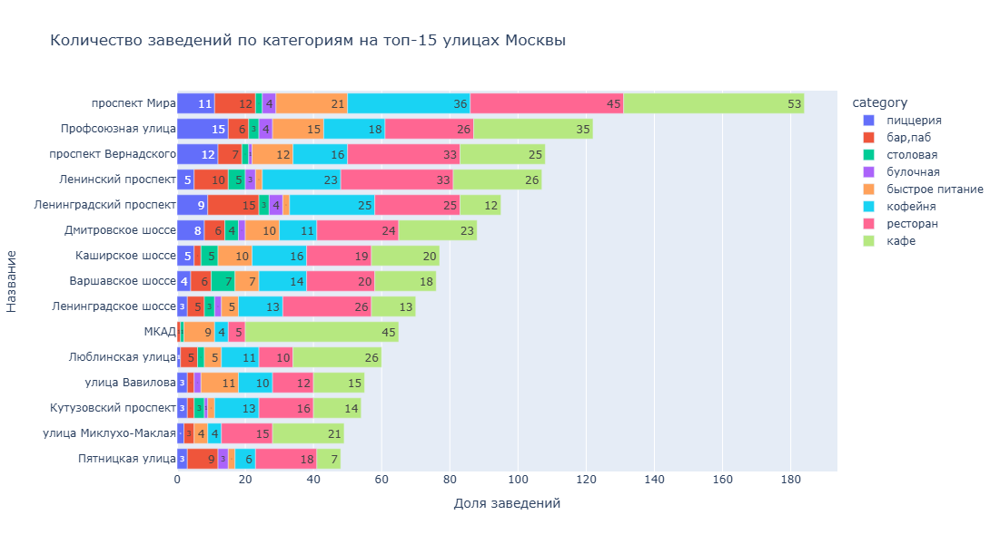

In [50]:
# столбчатая диаграмма с количеством заведений для топ-15 улиц
fig = px.bar(top15_street_category.sort_values(by='name', ascending=True),
             y='street',
             x='name',
             text= 'name',
             color='category',
             title="Количество заведений по категориям на топ-15 улицах Москвы",
             height=600,
             width=1000
             )

fig.update_layout(
    yaxis={'categoryorder': 'total ascending'},
    xaxis_title = 'Доля заведений',
    yaxis_title = 'Название')


fig.show()

Вывод: 

Лидером по количеству заведений является проспект Мира. В топе-3 так же кафе, ресторан и кофейня.

In [51]:
top_15_street

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [52]:
# соединяем данные
top_15_df = places[places['street'].isin(top_15_street['street'])]
                      
top_15_df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8396,Пекинский Двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,Ленинский проспект,False
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True


In [53]:
districts_top_15 = top_15_df.pivot_table(
    index=['district'], 
    values='name',aggfunc='count').sort_values(by='name', ascending=False).reset_index()
districts_top_15.columns = ['district', 'total_count']
display(districts_top_15)

,district,total_count
0,Юго-Западный административный округ,293
1,Северный административный округ,232
2,Южный административный округ,197
3,Западный административный округ,176
4,Северо-Восточный административный округ,162
5,Центральный административный округ,108
6,Юго-Восточный административный округ,87
7,Восточный административный округ,2
8,Северо-Западный административный округ,1


In [54]:
#карта 

m_10 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=districts_top_15,
    columns=['district', 'total_count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество популярных заведений по районам',
).add_to(m_10)

# выводим карту
m_10

<a id="results11"></a>
### Улицы с одним объектом общепита

In [55]:
# сводная таблица с улицами, на которых находится только одно завеление
one_cafe = places.pivot_table(index=['street'], values='name', aggfunc='count').reset_index()
one_cafe = one_cafe.query('name == 1')
one_cafe

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [56]:
# сводная таблица с заведениями, которые находятся на этих улицах

one_cafe_cat = top_15_count[top_15_count['street'].isin(one_cafe['street'])]
one_cafe_cat = one_cafe_cat.groupby('category')['name'].count().sort_values().reset_index()
one_cafe_cat.columns = ['category', 'total_count']
one_cafe_cat

,category,total_count
0,булочная,8
1,пиццерия,15
2,быстрое питание,23
3,столовая,36
4,"бар,паб",39
5,кофейня,84
6,ресторан,93
7,кафе,160


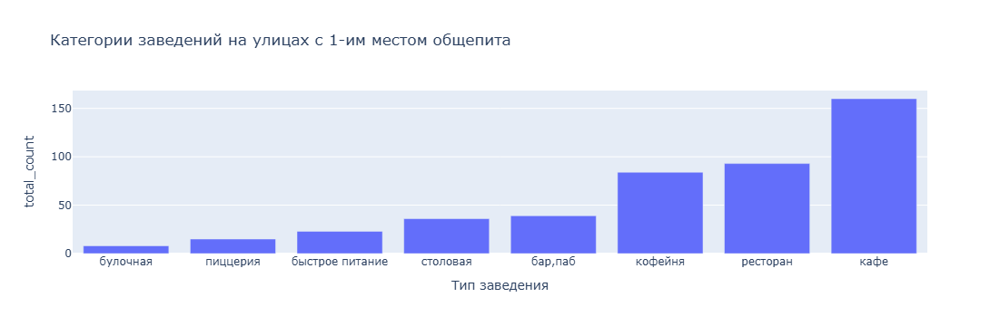

In [57]:
# столбчатая диаграмма
fig = px.bar(one_cafe_cat.sort_values(by='total_count', ascending=True), x='category', y='total_count',
            labels={'category':'Тип заведения'},
            title='Категории заведений на улицах с 1-им местом общепита')
fig.show()

Вывод: 

Чаще всего единственным объектом общепита на улице является кафе.

<a id="results12"></a>
### Фоновая картограмма (хороплет) с медианой средней цены чека для каждого района

In [58]:
# сводная таблица медианы средней цены для каждого района
median_price = places.groupby('district')['middle_avg_bill'].median().reset_index()
median_price

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [59]:
#карта 

m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m_3)

# выводим карту
m_3

Вывод: 

В ЦАО и ЗАО самый высокий средний чек - 1000 р. Минимальный чек в ЮВАО. На карте видно, что западное направление Москвы выше по средним ценам, чем восточное направление.

Общий вывод:

    Самой распространенной категорией заведений являются кафе, которые составляют 28,3% от общего числа. На втором месте по количеству находятся рестораны (24,3%), а на третьем - кофейни (16,81%). Наименее популярными заведениями являются булочные (3%).
    Рестораны и бары обладают наибольшим количеством посадочных мест и часто привлекают большие компании. Кофейни занимают третье место. Пиццерии и булочные, напротив, чаще посещаются для быстрого перекуса.
    В Москве более половины заведений (62%) являются несетевыми. Однако для кофеен и пиццерий соотношение сетевых и несетевых заведений примерно равно 50 на 50.
    Самым популярным сетевым заведением является кофейня "Шоколадница", где предлагается много различных и вкусных видов кофе.
    В Москве всего 9 округов, и центральный округ является абсолютным лидером по количеству заведений. Количество заведений в центральном округе превышает почти в два раза количество в ближайшем северном округе. Далее количество заведений плавно снижается от округа к округу без резких скачков. Северный и южный округи занимают второе и третье места, а Северозападный округ находится на последнем месте по количеству заведений.
    По категориям заведений наиболее популярными являются кафе, затем рестораны. В центральном округе преобладают рестораны, а кафе занимают второе место. Кофейни занимают третье место и составляют от 13% до 21% в разных округах. Булочные и столовые встречаются в меньшем количестве по всем округам.
    Бары и пабы имеют самый высокий средний рейтинг. Пиццерии, рестораны и кофейни имеют практически одинаковый средний рейтинг около 4,29. Заведения быстрого питания замыкают список. В целом, рейтинг всех категорий заведений не ниже 4.
    Центральный административный округ имеет самый высокий средний рейтинг (4,38), за ним следует северный округ (4,24).
    При анализе распределения заведений по улицам видно, что наибольшее количество заведений находится на проспекте Мира. Кафе и рестораны преобладают. Затем идет Профсоюзная улица. В целом, кафе и ресторанов больше, чем заведений других категорий.
    Медианный чек наибольший в центральном округе (1000 рублей), также как и в западном округе (1000 рублей), что может свидетельствовать о преобладании заведений более высокого класса в этих районах. Самый низкий чек наблюдается в юго-восточном округе, где заведения более доступны.



<a id="coffee"></a>
## Детализируем исследование: открытие кофейни

<a id="coffee1"></a>
### Анализ кофеен в датасете

In [60]:
coffee_places_sum = places[places['category'] == 'кофейня']
print('Всего кофеен в датасете:',coffee_places_sum['category'].count())

Всего кофеен в датасете: 1413


In [61]:
# сводная таблица количества кофеен по районам Москвы
coffee_districts = coffee_places_sum.groupby('district')['name']\
    .count().reset_index().sort_values(by='name', ascending=False)
coffee_districts

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


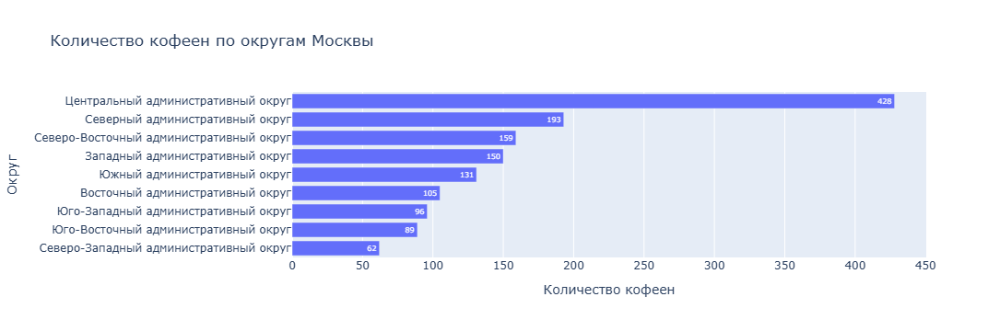

In [62]:
# столбчатая диаграмма с количеством кофеен по округам Москвы
fig = px.bar(coffee_districts.sort_values(by='name', ascending=True),
             y='district',
             x='name',
             text= 'name',
             title="Количество кофеен по округам Москвы")

fig.update_layout(
    xaxis_title = 'Количество кофеен',
    yaxis_title = 'Округ')


fig.show()

ТОП-3 районов по количеству кофеен:
1. ЦАО
2. САО
3. СВАО

Наименьшее количество кофеен в СЗАО.

In [63]:
# хороплет количества кофее Москвы
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster_2 = MarkerCluster().add_to(m_4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_2(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_2)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_places_sum.apply(create_clusters_2, axis=1)

m_4

In [64]:
coffee_districts

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [65]:
# хороплет количества кофеен Москвы по округам

m_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_districts,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по округам',
).add_to(m_5)

# выводим карту
m_5

Вывод: больше всего кофеен находится в ЦАО.

<a id="coffee2"></a>
Круглосуточные кофейни

In [66]:
coffee_24 = coffee_places_sum[coffee_places_sum['is_24/7'] == True]
print('Круглосуточных кофеен', len(coffee_24))

Круглосуточных кофеен 59


In [67]:
print('Процент круглосуточных кофеен:', "{0:.2%}".format(len(coffee_24) / len(coffee_places_sum)))

Процент круглосуточных кофеен: 4.18%


Вывод: круглосуточные кофейни есть, но их очень мало от общего числа.

<a id="coffee3"></a>
### Рейтинг кофеен

In [68]:
# сводная таблица рейтинга кофеен по районам Москвы
coffee_rating = coffee_places_sum.groupby('district')['rating']\
        .mean().round(3).reset_index().sort_values(by='rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.336
4,Северо-Западный административный округ,4.326
2,Северный административный округ,4.292
0,Восточный административный округ,4.283
7,Юго-Западный административный округ,4.283
8,Южный административный округ,4.233
6,Юго-Восточный административный округ,4.226
3,Северо-Восточный административный округ,4.217
1,Западный административный округ,4.195


In [69]:
# хороплет среднего рейтинга кофеен Москвы
m_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',    
    legend_name='Средний рейтинг кофеен по районам'
).add_to(m_6)

# выводим карту
m_6

Вывод: 

Самый высокий рейтинг в ЦАО и СЗАО. Самый низкий рейтинг у ЗАО.

<a id="coffee4"></a>
### Анализ стоимости чашки капуччино

In [70]:
# сводная таблица медианной стоимости чашки кофе по районам
coffee_price_median = coffee_places_sum.groupby('district', as_index=False)['middle_coffee_cup']\
                .agg('median').round(2).sort_values('middle_coffee_cup', ascending=False)


print(f'Медианная стоимость чашки кофе в Москве:', coffee_price_median['middle_coffee_cup'].median())

Медианная стоимость чашки кофе в Москве: 162.5


In [71]:
coffee_price_median

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [72]:
m_7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_price_median,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',    
    legend_name='Медианная цена чашки кофе'
).add_to(m_7)

# выводим карту
m_7

<a id="vivod"></a>
## Заключение

1. Была проведена предобработка данных. Добавлен столбец с названием улицы и столбец для обозначения круглосуточных заведений.

2. По количеству заведений лидирует категория "кафе" (28,3%)

3. Наибольшее кол-во посадочных мест находится в ресторанах, барах и пабах.

4. В центральном районе самое большое количество заведений. Самая популярная категория заведений в ЦАО - ресторан.

5. Заведения с самым высоким рейтингом - бары и пабы. Это связано скорее всего с тем, что в такие заведения ходят непривередливые люди и кухня там простая в реализации.

6. Заведения с самым высоким рейтингом располагаются в ЦАО.

7. Больше всего заведений находится на проспекте Мира, из всех категорий там преобладают кафе.

8. ЦАО и ЗАО имеют средний чек (по медиане) 1000 рублей.

9. Больше всего кофеен в ЦАО.

10. Медианная цена за чашку кофе распределена следующим образом: 
 - Юго-Западный административный округ - 198.0
 - Центральный административный округ - 190.0
 - Западный административный округ - 189.0

Рекомендовано открывать кофейню в Юго-западном округе. Во-первых там самая высокая медианная стоимость чашки кофе. Во-вторых в ЮЗАО мало кофеен - всего 96 шт. В-третьих в ЮЗАО много университетов, а значит студентов. Кофейня планируется в стиле сериала "Друзья", а это молодежный сериал и значит будет высокий спрос на кофейню подобного рода.

Презентация: <https://drive.google.com/file/d/1DUJo89Lmo7GHAganpJjA4bIxNraCtE9p/view?usp=sharing>